In [35]:
# To support both python 2 and python 3
from __future__ import print_function, division, unicode_literals
# from ipywidgets import interact, interactive, fixed, interact_manual
# import ipywidgets as widgets

# Usual imports
import numpy as np
import os
import cv2
import warnings
from os.path import join as path_join
from tqdm import tqdm
import json
tqdm.pandas()
import itertools
from datetime import datetime

# To plot pretty figures
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# import seaborn as sns

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

import pandas as pd
pd.set_option('display.expand_frame_repr', False)
pd.set_option("display.max_columns", 100)

# while not os.getcwd().endswith("ml"):
#     os.chdir(os.path.abspath(os.path.join(os.pardir)))
print("Working dir:", os.getcwd())

from Common.analysis.analysis_tools import calculate_acceptable_precision_error
from Common.data_manipulation.pandas_tools import save_dataframe, add_face_id, load_df, separate_df_based_on_column_range, add_image_id
from Common.data_manipulation.dictionary_tools import convert_dict_lists_to_list_of_dicts, create_or_append_to_dict_of_lists

# from Common.paths.dataset_paths import 
from Common.image_tools.image_loading import load_image
from Common.image_tools.cropping import crop_box
from Common.image_tools.resizer import resize_image

from Common.data_manipulation.pickler import write_pickle, load_pickle

from Common.machine_learning_tools.model_tools.tensoflow_model_tools import initialize_memory_growth

from Common.miscellaneous import print_indexed_list, print_fraction, verbose_print
from Common.visualizations.image_visualizations import show_image, show_images, draw_pose, draw_bounding_box, draw_landmarks, draw_confidences
from Common.visualizations.figure_plotting import plot_histogram, plot_multiple_histograms, plot_scatter_historgram, plot_CED_curve, plot_multiple_CED_curves, plot_xy_curves, plot_xs_and_ys

Working dir: D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT


In [36]:
experiments_path = path_join(os.getcwd(), "experiments")
data_filtering_path = path_join(os.getcwd(), "data_filtering")

In [4]:
experiment_types = sorted(list(os.listdir(experiments_path)))
print_indexed_list(experiment_types)

0 MNIST-LeNet1
1 MNIST-LeNet2


In [6]:
experiment_type_idx = 1

experiment_type_path = path_join(experiments_path, experiment_types[experiment_type_idx])
# experiment_type_path = path_join(experiments_path, experiment_types[experiment_type_idx], "Stage 1")
experiments = sorted(list(os.listdir(experiment_type_path)))
print_indexed_list(experiments)

0 MNIST-LeNet2-3-10
1 MNIST-LeNet2-3-25-2
2 MNIST-LeNet2-3-40
3 MNIST-LeNet2-505-10
4 MNIST-LeNet2-505-25-2
5 MNIST-LeNet2-505-40
6 MNIST-LeNet2-507-10
7 Stage 1


In [10]:
exp_idx = 1

experiment_path = path_join(experiment_type_path, experiments[exp_idx])
experiment_path

'D:\\Igno\\Reikalingi\\KTU Magistras\\Magistrinis\\OoMLeT\\experiments\\MNIST-LeNet2\\MNIST-LeNet2-3-25-2'

In [11]:
results_csv_name = "results.csv"
csv_fullname = path_join(experiment_path, results_csv_name)

res_df = load_df(csv_fullname)
res_df

Loaded a Dataframe with shape 20 × 11 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet2\MNIST-LeNet2-3-25-2\results.csv
at  2024-05-03 13:43:34.432113


,learning_rate,reg_param,dropout_rate,conv1_depth,conv2_depth,fc_depth,activation,optimizer,batch_normalization,val_acc,test_acc
0,0.001924,0.888487,0.314462,80,256,48,elu,Adam,1,0.9996,0.9910
1,0.100659,0.619205,0.633428,288,144,528,tanh,AdaDelta,1,1.0000,0.9913
2,0.001814,0.669453,0.506206,280,160,544,lrelu,AdaDelta,0,0.9622,0.9624
3,0.102605,0.395746,0.259157,16,184,32,tanh,Adam,1,0.9998,0.9921
4,0.104955,0.088901,0.391203,232,144,376,lrelu,Adam,0,0.0000,0.0000
5,0.400000,0.950830,0.900000,352,40,624,tanh,GD,1,0.9998,0.9914
6,0.400000,0.000000,0.900000,176,56,672,tanh,GD,1,1.0000,0.9930
7,0.400000,0.000000,0.900000,296,160,792,tanh,GD,1,1.0000,0.9929
8,0.400000,1.000000,0.900000,208,8,864,lrelu,Momentum,1,0.0000,0.0000
9,0.400000,0.000000,0.900000,352,248,688,tanh,GD,1,1.0000,0.9935


In [78]:
res_df.sort_values('test_acc')

,learning_rate,reg_param,dropout_rate,conv1_depth,conv2_depth,fc_depth,activation,optimizer,batch_normalization,val_acc,test_acc
25,0.132135,0.111513,0.507501,228,178,675,relu,Adam,1,0.0000,0.0000
21,0.021232,0.030181,0.530670,250,178,709,lrelu,RMSProp,0,0.0000,0.0000
20,0.103948,0.724963,0.754454,201,146,692,elu,Adam,0,0.0000,0.0000
29,0.000102,0.672407,0.675932,81,195,1007,tanh,GD,0,0.9260,0.9330
27,0.000827,0.525637,0.749348,30,107,917,relu,AdaDelta,0,0.9524,0.9514
6,0.000144,0.920372,0.446045,122,96,594,tanh,AdaGrad,0,0.9622,0.9611
11,0.000290,0.801584,0.132027,45,161,978,lrelu,AdaGrad,0,0.9778,0.9787
17,0.000344,0.557292,0.134108,39,154,879,elu,AdaGrad,1,0.9892,0.9832
23,0.005847,0.046007,0.365272,46,111,909,lrelu,Adam,0,0.9856,0.9852
18,0.002182,0.695527,0.728772,38,86,922,relu,GD,1,0.9908,0.9869


std: 0.29616881709967746


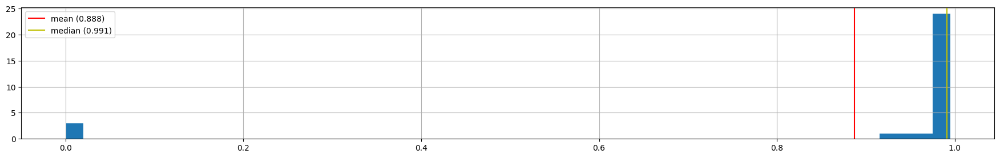

<Figure size 640x480 with 0 Axes>

In [80]:
plot_histogram(res_df['test_acc'], fig_size=(22, 3))

In [81]:
median_acc = res_df['test_acc'].quantile(0.7)
good_df = res_df.loc[res_df['test_acc'] >= median_acc]
good_indice = list(good_df.index)
good_df

,learning_rate,reg_param,dropout_rate,conv1_depth,conv2_depth,fc_depth,activation,optimizer,batch_normalization,val_acc,test_acc
2,0.005236,0.901249,0.159754,227,175,619,relu,RMSProp,1,1.0000,0.9950
3,0.007612,0.099439,0.347205,63,186,1013,lrelu,Adam,1,1.0000,0.9944
5,0.072276,0.589436,0.773763,39,130,928,lrelu,AdaGrad,1,1.0000,0.9930
7,0.005031,0.023840,0.418954,245,186,654,elu,Adam,0,0.9996,0.9938
9,0.003026,0.689463,0.362544,224,149,658,relu,RMSProp,1,1.0000,0.9941
14,0.000178,0.263139,0.016588,101,184,1019,elu,RMSProp,0,1.0000,0.9933
15,0.162022,0.784729,0.817182,20,108,898,lrelu,GD,1,1.0000,0.9935
19,0.000312,0.432660,0.184072,230,167,696,tanh,Adam,1,1.0000,0.9934
24,0.003442,0.157645,0.487227,221,174,647,lrelu,AdaGrad,0,0.9994,0.9930
28,0.000124,0.191961,0.887376,214,156,625,relu,RMSProp,1,1.0000,0.9934


In [20]:
res_df['test_acc'].quantile(0.7)

0.9944

## Concat results csvs

In [8]:
result_dfs = []

for task_name in os.listdir(experiments_path):
    task_exps_path = path_join(experiments_path, task_name)
    for experiment_name in os.listdir(task_exps_path):
        split_exp_name = experiment_name.split('-')
        
        if len(split_exp_name) > 2:
            result_csv_name = path_join(task_exps_path, experiment_name, "results.csv")
            
            if os.path.isfile(result_csv_name):
                result_df = load_df(result_csv_name)
                
                result_df['task'] = task_name
                result_df['parameter'] = split_exp_name[-2]
                result_df['num'] = split_exp_name[-1]
                
                result_dfs.append(result_df)
                
            else:
                print("No result file in ", result_csv_name)
                
#         elif "Stage" in experiment_name:
#             for experiment_name in os.listdir(task_exps_path):
#                 split_exp_name = experiment_name.split('-')

#                 if len(split_exp_name) > 2:
#                     result_csv_name = path_join(task_exps_path, experiment_name, "results.csv")

#                     if os.path.isfile(result_csv_name):
#                         result_df = load_df(result_csv_name)

#                         result_df['task'] = task_name
#                         result_df['parameter'] = split_exp_name[-2]
#                         result_df['num'] = split_exp_name[-1]

#                         result_dfs.append(result_df)

#                     else:
#                         print("No result file in ", result_csv_name)
            
full_res_df = pd.concat(result_dfs)
full_res_df

Loaded a Dataframe with shape 30 × 11 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-10-2\results.csv
at  2024-05-03 13:40:38.698275
Loaded a Dataframe with shape 30 × 11 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-10-3\results.csv
at  2024-05-03 13:40:38.701776
Loaded a Dataframe with shape 30 × 11 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-10-4\results.csv
at  2024-05-03 13:40:38.703776
Loaded a Dataframe with shape 30 × 11 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-10-5\results.csv
at  2024-05-03 13:40:38.706276
No result file in  D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-10-6\results.csv
Loaded a Dataframe with shape 30 × 11 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-10-7\results.csv


,learning_rate,reg_param,conv1_depth,pool1_size,conv2_depth,pool2_size,window_size,fc_depth,dropout_rate,val_acc,test_acc,task,parameter,num,activation,optimizer,batch_normalization
0,0.000338,0.345561,147,2.0,252,2.0,5.0,310,0.000103,0.0964,0.0910,MNIST-LeNet1,10,2,NaN,NaN,NaN
1,0.002706,0.628998,282,3.0,106,2.0,7.0,773,0.349035,1.0000,0.9956,MNIST-LeNet1,10,2,NaN,NaN,NaN
2,0.012075,0.495383,275,2.0,110,3.0,2.0,777,0.257890,0.8448,0.8568,MNIST-LeNet1,10,2,NaN,NaN,NaN
3,0.000100,1.000000,307,3.0,93,2.0,10.0,762,0.666180,1.0000,0.9935,MNIST-LeNet1,10,2,NaN,NaN,NaN
4,0.025025,0.440464,274,3.0,117,3.0,6.0,771,0.031514,0.0956,0.1009,MNIST-LeNet1,10,2,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,0.000100,1.000000,352,NaN,352,NaN,NaN,416,0.000000,0.9896,0.9853,MNIST-LeNet2,505,40,tanh,Momentum,0.0
16,0.400000,1.000000,352,NaN,352,NaN,NaN,1024,0.000000,1.0000,0.9934,MNIST-LeNet2,505,40,tanh,GD,1.0
17,0.400000,1.000000,176,NaN,352,NaN,NaN,552,0.000000,0.1054,0.1028,MNIST-LeNet2,505,40,tanh,GD,0.0
18,0.000100,1.000000,352,NaN,176,NaN,NaN,688,0.900000,0.9846,0.9851,MNIST-LeNet2,505,40,tanh,Momentum,0.0


In [37]:
full_res_df = full_res_df.loc[full_res_df['task'] == 'MNIST-LeNet2']
full_res_df

,learning_rate,reg_param,conv1_depth,pool1_size,conv2_depth,pool2_size,window_size,fc_depth,dropout_rate,val_acc,test_acc,task,parameter,num,activation,optimizer,batch_normalization
0,0.000516,0.453607,16,NaN,248,NaN,NaN,16,0.6,0.0994,0.1032,MNIST-LeNet2,3,10,sigmoid,AdaGrad,0.0
1,0.001624,0.248109,296,NaN,112,NaN,NaN,736,0.3,0.9998,0.9911,MNIST-LeNet2,3,10,relu,RMSProp,0.0
2,0.001290,0.037859,288,NaN,120,NaN,NaN,744,0.4,0.9852,0.9790,MNIST-LeNet2,3,10,elu,AdaDelta,1.0
3,0.400000,1.000000,352,NaN,8,NaN,NaN,1024,0.0,0.1030,0.0974,MNIST-LeNet2,3,10,sigmoid,Momentum,0.0
4,0.000100,0.000000,272,NaN,176,NaN,NaN,624,0.6,0.8556,0.8564,MNIST-LeNet2,3,10,elu,AdaDelta,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15,0.000100,1.000000,352,NaN,352,NaN,NaN,416,0.0,0.9896,0.9853,MNIST-LeNet2,505,40,tanh,Momentum,0.0
16,0.400000,1.000000,352,NaN,352,NaN,NaN,1024,0.0,1.0000,0.9934,MNIST-LeNet2,505,40,tanh,GD,1.0
17,0.400000,1.000000,176,NaN,352,NaN,NaN,552,0.0,0.1054,0.1028,MNIST-LeNet2,505,40,tanh,GD,0.0
18,0.000100,1.000000,352,NaN,176,NaN,NaN,688,0.9,0.9846,0.9851,MNIST-LeNet2,505,40,tanh,Momentum,0.0


In [38]:
full_res_df.corr()

<ipython-input-38-1945b4c2dee0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  full_res_df.corr()


,learning_rate,reg_param,conv1_depth,pool1_size,conv2_depth,pool2_size,window_size,fc_depth,dropout_rate,val_acc,test_acc,batch_normalization
learning_rate,1.000000,-0.062249,-0.071030,NaN,0.122391,NaN,NaN,0.162208,0.081296,-0.038541,-0.042691,0.355558
reg_param,-0.062249,1.000000,-0.166817,NaN,0.077895,NaN,NaN,-0.039965,0.050466,-0.052109,-0.050500,-0.274457
conv1_depth,-0.071030,-0.166817,1.000000,NaN,-0.140550,NaN,NaN,0.201673,-0.046182,-0.008102,-0.007941,-0.142206
pool1_size,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
conv2_depth,0.122391,0.077895,-0.140550,NaN,1.000000,NaN,NaN,-0.037787,-0.197616,0.184803,0.182884,0.207363
pool2_size,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
window_size,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
fc_depth,0.162208,-0.039965,0.201673,NaN,-0.037787,NaN,NaN,1.000000,0.134699,0.066551,0.066347,0.178026
dropout_rate,0.081296,0.050466,-0.046182,NaN,-0.197616,NaN,NaN,0.134699,1.000000,0.100891,0.103505,0.169124
val_acc,-0.038541,-0.052109,-0.008102,NaN,0.184803,NaN,NaN,0.066551,0.100891,1.000000,0.999917,0.385857


In [23]:
full_res_df['dropout_rate'] = [np.round(drop_rate, 1) for drop_rate in full_res_df['dropout_rate']]

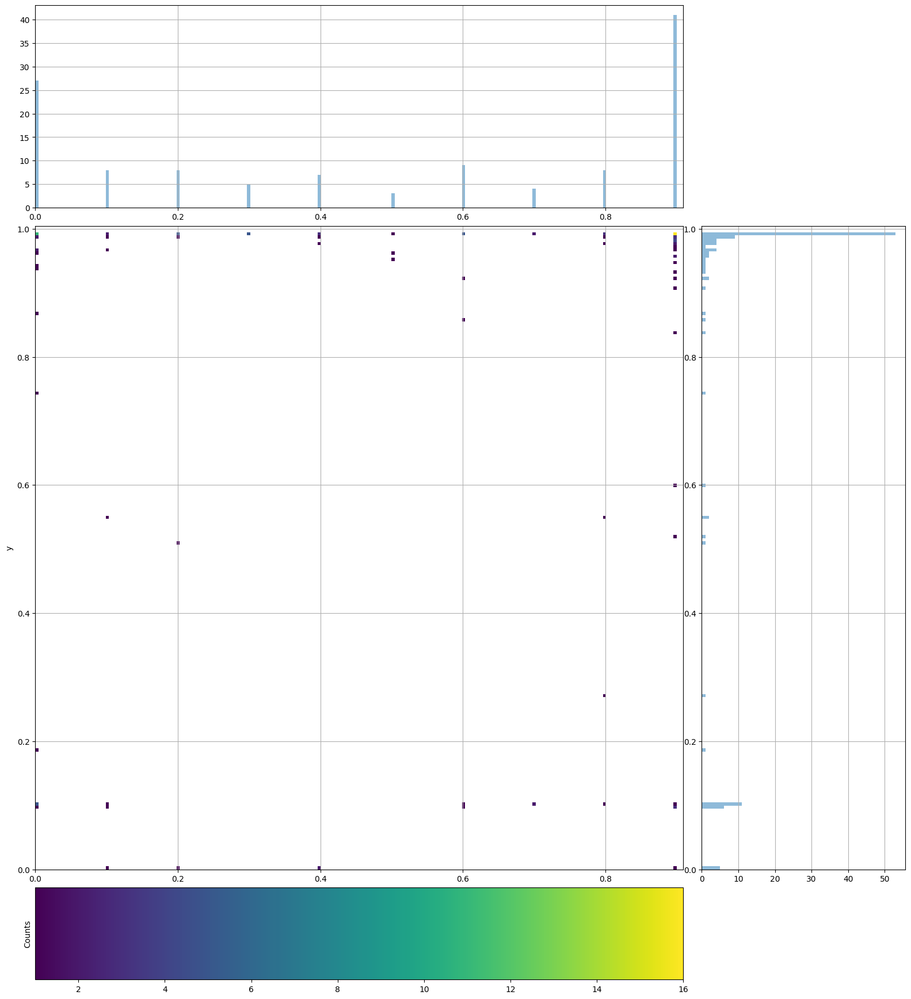

<Figure size 640x480 with 0 Axes>

In [34]:
sorted_values = full_res_df.sort_values('test_acc')[['dropout_rate', 'test_acc']]
plot_scatter_historgram(sorted_values['dropout_rate'], sorted_values['test_acc'])

In [26]:
from itertools import combinations, product

In [39]:
columns_to_check = ["optimizer"]

uniques = [sorted(pd.unique(full_res_df[column_to_check])) for column_to_check in columns_to_check]

for permutation in product(*uniques):
    print_string = ""
    
    unique_df = full_res_df.copy()
    for clmn, perm in zip(columns_to_check, permutation):
        unique_df = unique_df.loc[unique_df[clmn] == perm]
        
        print_string += "{}={} | ".format(clmn, perm)
        
    mean_acc = unique_df['test_acc'].mean()
    unique_size = len(unique_df['test_acc'])
    
    print_string += "size: {:2d} | test acc: {:.4f}".format(unique_size, mean_acc)
        
    print(print_string)
    

optimizer=AdaDelta | size: 17 | test acc: 0.7797
optimizer=AdaGrad | size: 11 | test acc: 0.6245
optimizer=Adam | size: 14 | test acc: 0.7495
optimizer=GD | size: 33 | test acc: 0.7918
optimizer=Momentum | size: 33 | test acc: 0.8145
optimizer=RMSProp | size: 12 | test acc: 0.8340


In [36]:
bool(0)

False

In [19]:
full_res_df.corr()

<ipython-input-19-1945b4c2dee0>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  full_res_df.corr()


,learning_rate,reg_param,conv1_depth,pool1_size,conv2_depth,pool2_size,window_size,fc_depth,dropout_rate,val_acc,test_acc
learning_rate,1.000000,0.071615,-0.311787,0.186586,-0.177601,-0.110948,-0.127193,-0.033223,0.177379,-0.480981,-0.482140
reg_param,0.071615,1.000000,-0.095186,-0.184292,-0.168684,-0.181463,0.266571,-0.008776,0.044994,-0.030156,-0.029949
conv1_depth,-0.311787,-0.095186,1.000000,0.196843,0.218414,0.318840,-0.130848,0.516527,-0.145880,0.276640,0.277627
pool1_size,0.186586,-0.184292,0.196843,1.000000,0.151687,0.177646,0.131720,0.271490,0.067846,-0.016511,-0.017094
conv2_depth,-0.177601,-0.168684,0.218414,0.151687,1.000000,0.339088,-0.243495,-0.047325,-0.146604,0.111924,0.111359
pool2_size,-0.110948,-0.181463,0.318840,0.177646,0.339088,1.000000,-0.251245,0.094369,-0.101929,0.068068,0.070045
window_size,-0.127193,0.266571,-0.130848,0.131720,-0.243495,-0.251245,1.000000,-0.251712,0.197002,0.070328,0.068087
fc_depth,-0.033223,-0.008776,0.516527,0.271490,-0.047325,0.094369,-0.251712,1.000000,-0.300496,0.148653,0.150229
dropout_rate,0.177379,0.044994,-0.145880,0.067846,-0.146604,-0.101929,0.197002,-0.300496,1.000000,0.015611,0.013896
val_acc,-0.480981,-0.030156,0.276640,-0.016511,0.111924,0.068068,0.070328,0.148653,0.015611,1.000000,0.999952


# Training csv analysis

In [24]:
train_csv_name = "training.csv"

MIN_CORRECT_LOSS = 0.3

## concat training csvs

In [22]:
run_paths = sorted([le_dir for le_dir in os.listdir(experiment_path) if os.path.isdir(path_join(experiment_path, le_dir))])
run_paths

['0',
 '1',
 '10',
 '11',
 '12',
 '13',
 '14',
 '15',
 '16',
 '17',
 '18',
 '19',
 '2',
 '20',
 '21',
 '22',
 '23',
 '24',
 '25',
 '26',
 '27',
 '28',
 '29',
 '3',
 '4',
 '5',
 '6',
 '7',
 '8',
 '9']

In [23]:
dfs = []

for run_path in good_indice:
    train_csv_fullname = path_join(experiment_path, str(run_path), train_csv_name)
    df = load_df(train_csv_fullname)
    df['run'] = int(run_path)
    
    dfs.append(df)
    
full_df = pd.concat(dfs)
full_df.sort_values(['run', 'epoch', 'step'], inplace=True)
full_df

Loaded a Dataframe with shape 722450 × 4 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-25-3\1\training.csv
at  2024-04-30 16:38:47.642515
Loaded a Dataframe with shape 722450 × 4 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-25-3\3\training.csv
at  2024-04-30 16:38:48.050013
Loaded a Dataframe with shape 505715 × 4 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-25-3\4\training.csv
at  2024-04-30 16:38:48.327513
Loaded a Dataframe with shape 577960 × 4 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-25-3\6\training.csv
at  2024-04-30 16:38:48.561514
Loaded a Dataframe with shape 722450 × 4 from D:\Igno\Reikalingi\KTU Magistras\Magistrinis\OoMLeT\experiments\MNIST-LeNet1\MNIST-LeNet1-25-3\8\training.csv
at  2024-04-30 16:38:48.849013
Loaded a Dataframe with shape 563511 × 4 from D:\Igno\Reikalingi\

,epoch,step,index,loss,run
0,0,0,22779,2.406751e+00,1
1,0,0,29895,2.503526e+00,1
2,0,0,39998,2.239984e+00,1
3,0,0,25801,2.372301e+00,1
4,0,0,25520,2.207401e+00,1
...,...,...,...,...,...
722445,49,112,41953,1.192093e-07,27
722446,49,112,5124,7.939024e-05,27
722447,49,112,40984,1.192093e-07,27
722448,49,112,30042,3.266281e-05,27


In [274]:
# full_df = full_df.loc[full_df['run'].isin(good_indice)]
# full_df

In [25]:
def df_to_dict_of_losses(df):
    dfs = dict(tuple(good_run_df.groupby('index')['loss']))
    dict_of_losses = {key: np.array(list(value)) for key, value in dfs.items()}
    
    return dict_of_losses

In [31]:
runs_sample_losses = {}

for good_run_idx in tqdm(good_indice):
    good_run_df = full_df.loc[full_df['run'] == good_run_idx]
    
    dict_of_losses = df_to_dict_of_losses(good_run_df)
    
    runs_sample_losses[good_run_idx] = dict_of_losses
    
print(runs_sample_losses.keys())
runs_sample_losses[good_indice[0]], runs_sample_losses[good_indice[-1]]

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:07<00:00,  1.35it/s]


dict_keys([1, 3, 4, 6, 8, 12, 22, 25, 26, 27])


({0: array([2.79913140e+00, 5.46497150e-03, 3.78487590e-03, 3.61639070e-02,
         2.73985230e-02, 2.01800970e-04, 1.48417350e-02, 1.15947240e-03,
         4.57486140e-02, 1.03711545e-05, 1.54971950e-06, 2.42570650e-03,
         3.96226980e-02, 1.40787050e-02, 1.01776770e-03, 1.08790800e-03,
         3.52916420e-04, 6.13024630e-04, 3.14051960e-03, 4.10941730e-02,
         4.64905420e-05, 6.31807230e-06, 1.03711545e-05, 2.26495090e-05,
         2.14377100e-02, 2.28786100e+00, 4.31802000e-04, 3.33785470e-06,
         1.36652210e+00, 3.56014760e-04, 5.60282070e-06, 3.57627230e-06,
         2.30083220e-03, 3.57627800e-07, 2.15766490e-05, 2.68235240e-02,
         5.71508100e-02, 9.32173200e-05, 1.50679250e-02, 1.95634600e-02,
         0.00000000e+00, 2.38418300e-06, 1.54971950e-06, 4.74407820e-02,
         9.53673860e-07, 4.30763470e-03, 8.82109800e-05, 1.42478900e-01,
         1.06095700e-05, 1.19209280e-07]),
  20: array([9.7186200e-02, 1.5078839e-04, 1.2480434e-04, 1.3767726e-04,
     

In [279]:
# del runs_sample_losses[7]

## Example forgetting

Run 1 | val_acc: 0.9992 | test_acc: 0.9940
std: 1.6937031613236382


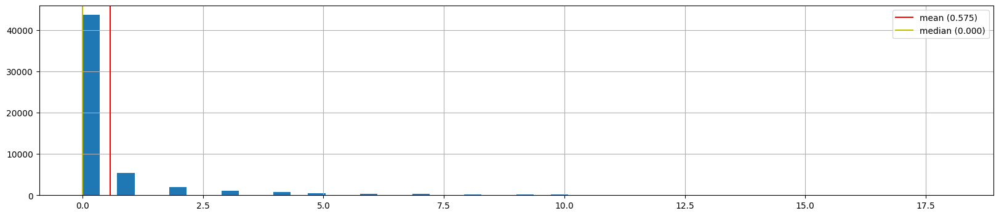

Run 3 | val_acc: 0.9998 | test_acc: 0.9947
std: 0.7691368780588295


<Figure size 640x480 with 0 Axes>

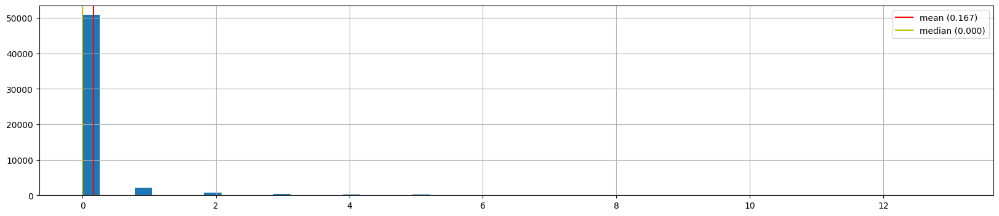

Run 6 | val_acc: 0.9996 | test_acc: 0.9949
std: 1.0381710039239345


<Figure size 640x480 with 0 Axes>

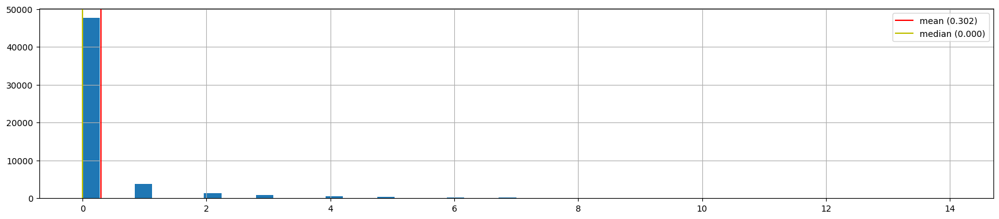

Run 8 | val_acc: 0.9992 | test_acc: 0.9958
std: 1.359434663125001


<Figure size 640x480 with 0 Axes>

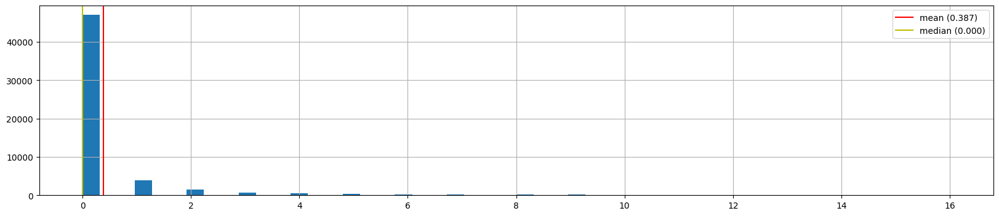

Run 12 | val_acc: 1.0000 | test_acc: 0.9955
std: 1.0577933376250612


<Figure size 640x480 with 0 Axes>

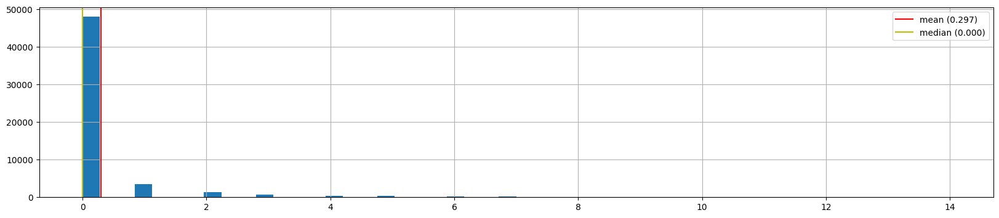

Run 19 | val_acc: 0.9998 | test_acc: 0.9948
std: 0.8730702127341399


<Figure size 640x480 with 0 Axes>

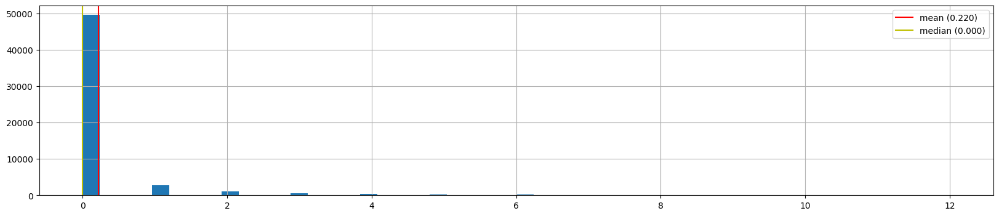

<Figure size 640x480 with 0 Axes>

In [280]:
runs_sample_forgetting = {}

for run_index, run_losses in runs_sample_losses.items():

    sample_forgetting = {}
    for sample_index, sample_losses in run_losses.items():
        forgetting_events = np.bitwise_and(sample_losses[:-1] < sample_losses[1:], sample_losses[1:] > MIN_CORRECT_LOSS)
        forgetting_events_count = np.sum(forgetting_events)

        sample_forgetting[sample_index] = forgetting_events_count
        create_or_append_to_dict_of_lists(runs_sample_forgetting, sample_index, forgetting_events_count)

    val_loss, test_loss = res_df.iloc[run_index][['val_acc', 'test_acc']]
    print("Run {} | val_acc: {:.4f} | test_acc: {:.4f}".format(run_index, val_loss, test_loss))
    plot_histogram(np.array(list(sample_forgetting.values())), fig_size=(20, 4))

In [281]:
runs_sample_forgetting

{0: [0, 1, 1, 1, 0, 5],
 1: [0, 0, 0, 0, 0, 0],
 2: [0, 0, 1, 0, 0, 0],
 3: [0, 0, 0, 0, 0, 0],
 4: [0, 0, 0, 0, 0, 0],
 5: [0, 0, 0, 0, 0, 0],
 6: [0, 0, 0, 0, 0, 0],
 7: [0, 0, 0, 0, 0, 0],
 8: [0, 0, 0, 0, 0, 0],
 9: [0, 0, 0, 0, 0, 0],
 10: [0, 0, 0, 0, 0, 0],
 11: [0, 0, 0, 0, 0, 0],
 12: [0, 0, 0, 0, 0, 0],
 13: [0, 0, 0, 0, 0, 0],
 14: [0, 0, 0, 0, 0, 0],
 15: [0, 0, 0, 0, 0, 0],
 16: [0, 0, 0, 0, 0, 0],
 17: [0, 0, 0, 0, 0, 0],
 18: [0, 0, 0, 1, 0, 0],
 19: [1, 0, 0, 0, 0, 0],
 20: [0, 0, 1, 0, 0, 0],
 21: [0, 0, 0, 0, 0, 0],
 22: [1, 0, 0, 0, 0, 0],
 23: [0, 0, 0, 0, 0, 0],
 24: [1, 2, 4, 2, 2, 0],
 25: [0, 1, 0, 1, 1, 0],
 26: [0, 0, 0, 0, 0, 0],
 27: [0, 0, 0, 0, 0, 0],
 28: [1, 0, 0, 0, 0, 0],
 29: [3, 0, 1, 1, 3, 2],
 30: [3, 0, 0, 0, 1, 0],
 31: [0, 0, 0, 0, 0, 0],
 32: [0, 0, 0, 0, 0, 0],
 33: [0, 0, 0, 0, 0, 0],
 34: [0, 0, 1, 0, 0, 0],
 35: [0, 0, 0, 0, 0, 0],
 36: [0, 0, 0, 0, 0, 0],
 37: [0, 0, 0, 0, 0, 0],
 38: [0, 0, 0, 0, 0, 1],
 39: [0, 0, 0, 0, 0, 0],
 40: [0, 0

std: 1.8469263776061893


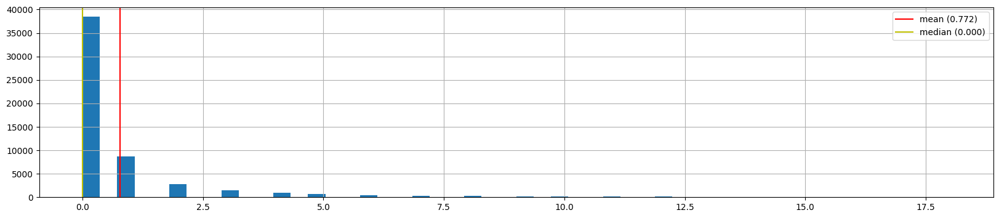

<Figure size 640x480 with 0 Axes>

In [282]:
runs_sample_max_forgets = {key: max(value) for key, value in runs_sample_forgetting.items()}
plot_histogram(np.array(list(runs_sample_max_forgets.values())), fig_size=(20, 4))

In [283]:
runs_sample_losses.keys()

dict_keys([1, 3, 6, 8, 12, 19])

In [284]:
runs_sample_forgetting_df = pd.DataFrame.from_dict(runs_sample_forgetting, orient='index', columns=runs_sample_losses.keys())
runs_sample_forgetting_df

,1,3,6,8,12,19
0,0,1,1,1,0,5
1,0,0,0,0,0,0
2,0,0,1,0,0,0
3,0,0,0,0,0,0
4,0,0,0,0,0,0
...,...,...,...,...,...,...
54995,0,0,1,0,0,0
54996,0,0,0,0,0,0
54997,0,0,0,0,0,0
54998,0,0,0,0,0,0


In [285]:
runs_sample_forgetting_df.sum()

1     31638
3      9190
6     16618
8     21275
12    16314
19    12089
dtype: int64

In [286]:
runs_sample_forgetting_df.corr()

,1,3,6,8,12,19
1,1.000000,0.724691,0.771763,0.802209,0.792995,0.740701
3,0.724691,1.000000,0.728103,0.811548,0.757499,0.766820
6,0.771763,0.728103,1.000000,0.792316,0.814608,0.762869
8,0.802209,0.811548,0.792316,1.000000,0.818275,0.787254
12,0.792995,0.757499,0.814608,0.818275,1.000000,0.781887
19,0.740701,0.766820,0.762869,0.787254,0.781887,1.000000


std: 1.8469263776061893


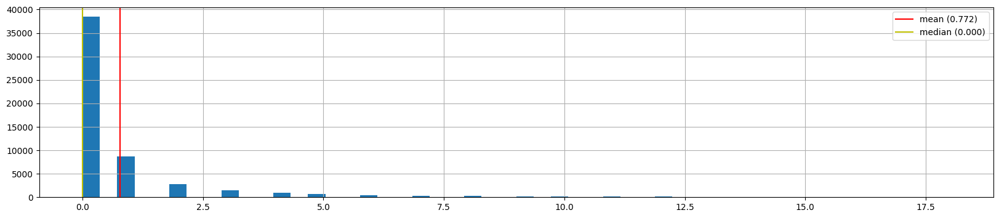

<Figure size 640x480 with 0 Axes>

In [287]:
max_forgets = runs_sample_forgetting_df.max(axis=1)
plot_histogram(max_forgets, fig_size=(20, 4))

In [288]:
# good_runs_sample_forgetting_df = runs_sample_forgetting_df[[1, 3, 5, 6, 8, 12, 17]]
# good_runs_sample_forgetting_df

In [290]:
unfergetful_samples = list(runs_sample_forgetting_df.loc[runs_sample_forgetting_df.max(axis=1) == 0].index)
len(unfergetful_samples), unfergetful_samples

(38492,
 [1,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  21,
  23,
  26,
  27,
  31,
  32,
  33,
  35,
  36,
  37,
  39,
  40,
  41,
  43,
  44,
  45,
  46,
  47,
  49,
  50,
  51,
  52,
  55,
  56,
  57,
  58,
  59,
  61,
  62,
  63,
  64,
  65,
  66,
  72,
  73,
  74,
  75,
  76,
  77,
  81,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  101,
  102,
  103,
  105,
  107,
  108,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  118,
  119,
  122,
  123,
  126,
  128,
  129,
  130,
  131,
  133,
  135,
  136,
  139,
  142,
  143,
  144,
  145,
  146,
  147,
  149,
  150,
  151,
  152,
  153,
  155,
  156,
  157,
  159,
  161,
  162,
  164,
  165,
  166,
  167,
  169,
  170,
  171,
  173,
  174,
  175,
  176,
  177,
  179,
  181,
  183,
  184,
  186,
  187,
  188,
  189,
  191,
  192,
  193,
  194,
  195,
  196,
  197,
  198,
  201,
  203,
  204,
  205,
  206,
  208,
  209,
  210,
  211,
  

In [190]:
26461 / 55000

0.48110909090909093

In [291]:
pickle_fullname = path_join(data_filtering_path, 'unforgetable_samples-40-1.pckl')
write_pickle(pickle_fullname, unfergetful_samples)

## Compare unforgetable samples

In [292]:
pckl_1_fullname = path_join(data_filtering_path, 'unforgetable_samples.pckl')
pckl_2_fullname = path_join(data_filtering_path, 'unforgetable_samples-25-1.pckl')
pckl_3_fullname = path_join(data_filtering_path, 'unforgetable_samples-40-1.pckl')

unfergetful_samples_1 = load_pickle(pckl_1_fullname)
unfergetful_samples_2 = load_pickle(pckl_2_fullname)
unfergetful_samples_3 = load_pickle(pckl_3_fullname)

len(unfergetful_samples_1), len(unfergetful_samples_2), len(unfergetful_samples_3)

(26461, 40551, 38492)

In [295]:
len(set(unfergetful_samples_1).intersection(unfergetful_samples_2).intersection(unfergetful_samples_3))

23683

In [296]:
len(set(unfergetful_samples_3).intersection(unfergetful_samples_2))

35225

In [297]:
55000 - 40551

14449

## First look hardness

In [32]:
runs_sample_losses

{1: {0: array([2.79913140e+00, 5.46497150e-03, 3.78487590e-03, 3.61639070e-02,
         2.73985230e-02, 2.01800970e-04, 1.48417350e-02, 1.15947240e-03,
         4.57486140e-02, 1.03711545e-05, 1.54971950e-06, 2.42570650e-03,
         3.96226980e-02, 1.40787050e-02, 1.01776770e-03, 1.08790800e-03,
         3.52916420e-04, 6.13024630e-04, 3.14051960e-03, 4.10941730e-02,
         4.64905420e-05, 6.31807230e-06, 1.03711545e-05, 2.26495090e-05,
         2.14377100e-02, 2.28786100e+00, 4.31802000e-04, 3.33785470e-06,
         1.36652210e+00, 3.56014760e-04, 5.60282070e-06, 3.57627230e-06,
         2.30083220e-03, 3.57627800e-07, 2.15766490e-05, 2.68235240e-02,
         5.71508100e-02, 9.32173200e-05, 1.50679250e-02, 1.95634600e-02,
         0.00000000e+00, 2.38418300e-06, 1.54971950e-06, 4.74407820e-02,
         9.53673860e-07, 4.30763470e-03, 8.82109800e-05, 1.42478900e-01,
         1.06095700e-05, 1.19209280e-07]),
  20: array([9.7186200e-02, 1.5078839e-04, 1.2480434e-04, 1.3767726e-04,
  

Run 1 | val_acc: 0.9986 | test_acc: 0.9951
std: 1.0658795452687693


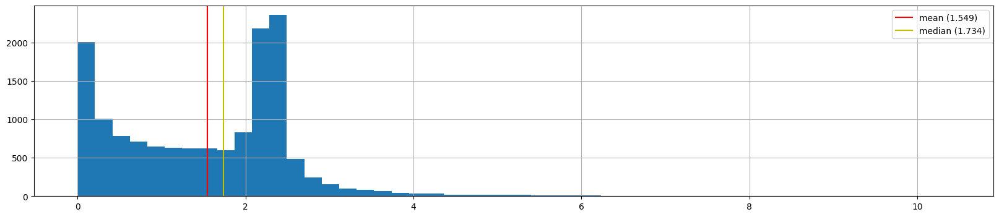

Run 3 | val_acc: 0.9994 | test_acc: 0.9949
std: 0.9393139087358712


<Figure size 640x480 with 0 Axes>

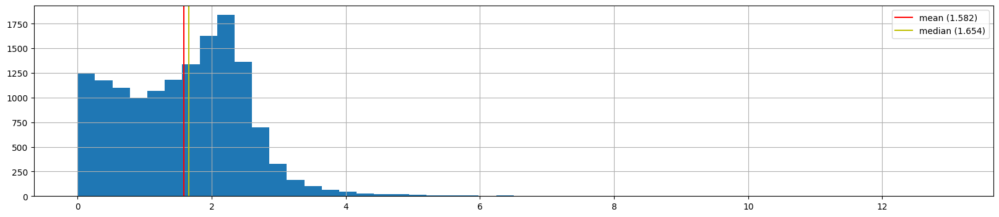

Run 4 | val_acc: 1.0000 | test_acc: 0.9954
std: 1.1118091071898337


<Figure size 640x480 with 0 Axes>

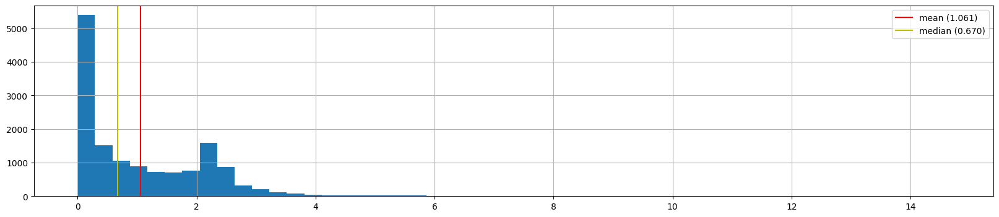

Run 6 | val_acc: 1.0000 | test_acc: 0.9959
std: 1.0753595620822205


<Figure size 640x480 with 0 Axes>

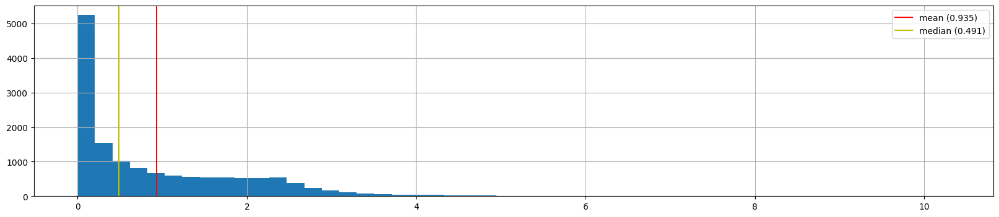

Run 8 | val_acc: 0.9984 | test_acc: 0.9960
std: 0.9154402431688451


<Figure size 640x480 with 0 Axes>

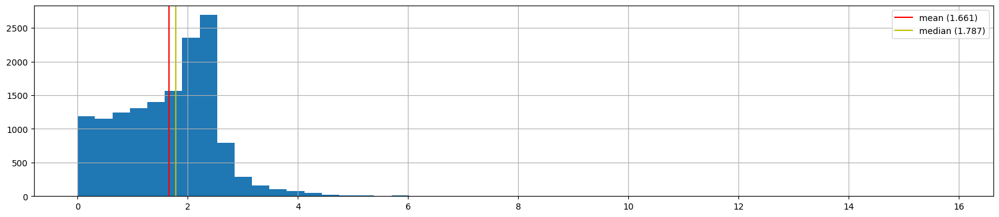

Run 12 | val_acc: 1.0000 | test_acc: 0.9955
std: 1.077936464769929


<Figure size 640x480 with 0 Axes>

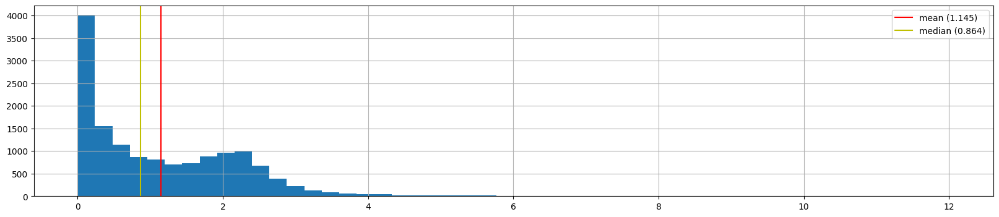

Run 22 | val_acc: 1.0000 | test_acc: 0.9944
std: 1.0640002023166752


<Figure size 640x480 with 0 Axes>

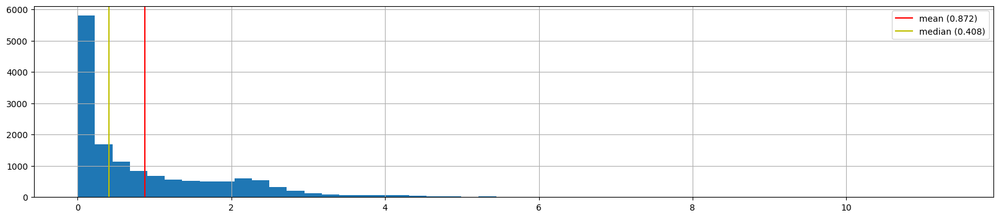

Run 25 | val_acc: 1.0000 | test_acc: 0.9944
std: 0.9924439281830129


<Figure size 640x480 with 0 Axes>

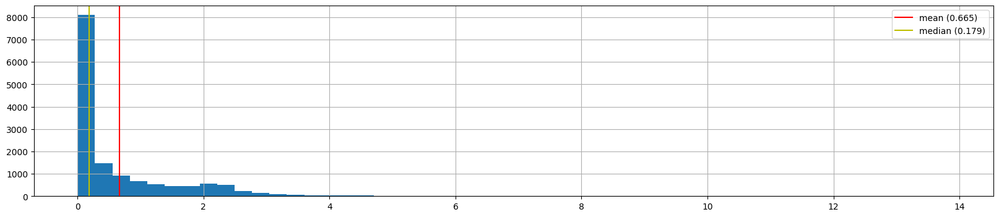

Run 26 | val_acc: 0.9988 | test_acc: 0.9962
std: 0.6659873801422206


<Figure size 640x480 with 0 Axes>

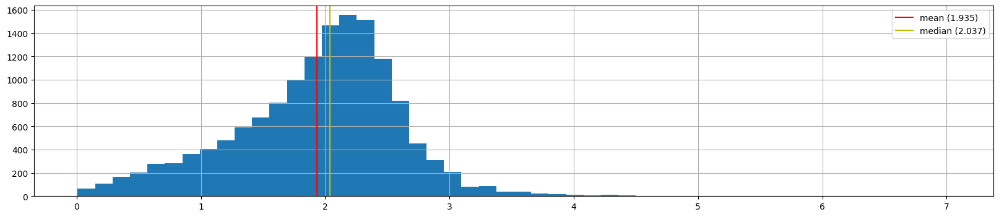

Run 27 | val_acc: 1.0000 | test_acc: 0.9945
std: 0.9668327365049904


<Figure size 640x480 with 0 Axes>

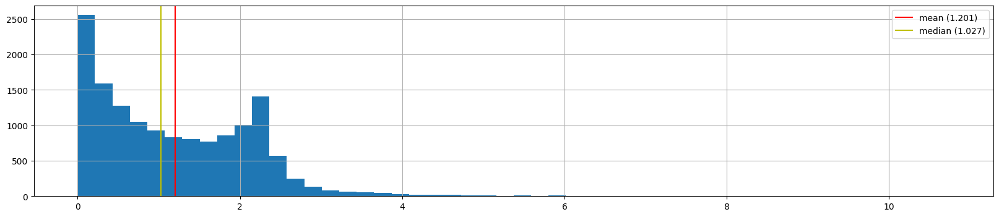

<Figure size 640x480 with 0 Axes>

In [34]:
runs_first_look = {}

for run_index, run_losses in runs_sample_losses.items():

    run_first_look = {}
    for sample_index, sample_losses in run_losses.items():
        run_first_look[sample_index] = sample_losses[0]
        
    runs_first_look[run_index] = run_first_look

    val_loss, test_loss = res_df.iloc[run_index][['val_acc', 'test_acc']]
    print("Run {} | val_acc: {:.4f} | test_acc: {:.4f}".format(run_index, val_loss, test_loss))
    plot_histogram(np.array(list(run_first_look.values())), fig_size=(20, 4))

In [37]:
first_look_df = pd.DataFrame.from_dict(runs_first_look)
first_look_df

,1,3,4,6,8,12,22,25,26,27
0,2.799131,0.179180,2.008586,0.049894,1.421442,1.514335,3.136664,0.078130,0.928639,0.352999
20,0.097186,0.152590,2.173197,0.000756,2.091093,0.004749,0.051037,0.000061,2.002371,0.071199
22,1.268149,1.254070,0.565359,2.116092,1.923231,1.905828,0.813948,1.998570,1.673585,0.514242
24,2.775063,2.357541,2.676801,0.278152,2.005364,4.796472,2.020309,0.027219,2.610280,2.980308
25,2.145992,1.935431,1.044055,0.069028,0.038876,0.015100,2.418806,0.003658,1.424511,0.047174
...,...,...,...,...,...,...,...,...,...,...
54983,0.140895,1.919556,0.679115,2.633876,1.073539,0.269834,0.366254,2.732132,1.160824,0.243663
54985,0.449770,0.203733,1.626859,2.571242,1.246027,0.717434,0.000506,0.020250,0.676861,0.218786
54986,2.868796,2.631692,0.706943,1.991342,0.828482,0.939856,0.334403,1.987653,1.216034,2.063394
54992,2.386170,0.622838,2.153856,0.100989,1.855814,1.234412,1.009924,1.722448,1.323483,0.594847


In [41]:
runs_flook_q = first_look_df.quantile(0.2, axis=0)
runs_flook_q

1     0.388616
3     0.635193
4     0.065100
6     0.054989
8     0.776612
12    0.126618
22    0.044337
25    0.016557
26    1.400040
27    0.253718
Name: 0.2, dtype: float64

In [44]:
runs_filtered_indice = {}

for run_idx in first_look_df.columns:
    runs_filtered_indice[run_idx] = list(first_look_df.loc[first_look_df[run_idx] <= runs_flook_q[run_idx]].index)
    print(run_idx, len(runs_filtered_indice[run_idx]))
    
runs_filtered_indice

1 2890
3 2890
4 2890
6 2890
8 2890
12 2890
22 2890
25 2890
26 2890
27 2890


{1: [20,
  38,
  63,
  67,
  69,
  89,
  109,
  140,
  143,
  172,
  183,
  202,
  207,
  222,
  227,
  240,
  256,
  262,
  285,
  312,
  318,
  343,
  363,
  376,
  463,
  472,
  488,
  489,
  493,
  529,
  531,
  533,
  561,
  563,
  578,
  591,
  637,
  644,
  670,
  674,
  682,
  688,
  700,
  706,
  729,
  749,
  793,
  826,
  828,
  866,
  872,
  888,
  893,
  896,
  900,
  955,
  969,
  989,
  998,
  1011,
  1030,
  1077,
  1083,
  1106,
  1207,
  1223,
  1236,
  1265,
  1269,
  1271,
  1274,
  1277,
  1293,
  1314,
  1326,
  1334,
  1347,
  1350,
  1390,
  1405,
  1408,
  1444,
  1448,
  1506,
  1511,
  1550,
  1554,
  1634,
  1652,
  1674,
  1702,
  1736,
  1747,
  1846,
  1867,
  1909,
  1918,
  1925,
  1975,
  1982,
  1988,
  1996,
  1999,
  2052,
  2073,
  2075,
  2108,
  2121,
  2200,
  2202,
  2258,
  2266,
  2290,
  2334,
  2371,
  2374,
  2406,
  2412,
  2427,
  2466,
  2502,
  2527,
  2548,
  2574,
  2582,
  2590,
  2608,
  2618,
  2639,
  2652,
  2658,
  2662,
  2672

In [47]:
for run_idx_1 in first_look_df.columns:
    for run_idx_2 in first_look_df.columns:
        if run_idx_1 < run_idx_2:
            overlap = len(set(runs_filtered_indice[run_idx_1]).intersection(runs_filtered_indice[run_idx_2]))
            
            print("Overlap between {:2d} and {:2d} : {} ({:.3f})".format(run_idx_1, run_idx_2, overlap, overlap/len(runs_filtered_indice[run_idx_1])))

Overlap between  1 and  3 : 821 (0.284)
Overlap between  1 and  4 : 856 (0.296)
Overlap between  1 and  6 : 879 (0.304)
Overlap between  1 and  8 : 810 (0.280)
Overlap between  1 and 12 : 859 (0.297)
Overlap between  1 and 22 : 795 (0.275)
Overlap between  1 and 25 : 856 (0.296)
Overlap between  1 and 26 : 697 (0.241)
Overlap between  1 and 27 : 892 (0.309)
Overlap between  3 and  4 : 862 (0.298)
Overlap between  3 and  6 : 856 (0.296)
Overlap between  3 and  8 : 897 (0.310)
Overlap between  3 and 12 : 869 (0.301)
Overlap between  3 and 22 : 816 (0.282)
Overlap between  3 and 25 : 920 (0.318)
Overlap between  3 and 26 : 807 (0.279)
Overlap between  3 and 27 : 1013 (0.351)
Overlap between  4 and  6 : 967 (0.335)
Overlap between  4 and  8 : 844 (0.292)
Overlap between  4 and 12 : 922 (0.319)
Overlap between  4 and 22 : 926 (0.320)
Overlap between  4 and 25 : 1019 (0.353)
Overlap between  4 and 26 : 758 (0.262)
Overlap between  4 and 27 : 941 (0.326)
Overlap between  6 and  8 : 833 (0.288

In [48]:
len(set(runs_filtered_indice[1]).intersection(runs_filtered_indice[3]).intersection(runs_filtered_indice[4]))

301

In [51]:
first_look_df.min(axis=1)

0        0.049894
20       0.000061
22       0.514242
24       0.027219
25       0.003658
           ...   
54983    0.140895
54985    0.000506
54986    0.334403
54992    0.100989
54994    0.019061
Length: 14449, dtype: float64

std: 0.3075834973152293


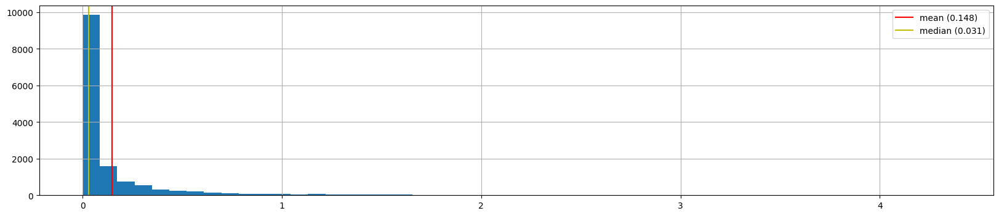

<Figure size 640x480 with 0 Axes>

In [52]:
plot_histogram(first_look_df.min(axis=1), fig_size=(20, 4))